# Testing Dataloader and Justifying Training Data

## Connecting to Drive, Imports and Helper functions

In [1]:
# connecting drive to colab notebook
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import sys
sys.path.append('/content/drive/MyDrive/drive_folder')
from custom_dataset_loader import TaiChiDataset, ToTensor
from __future__ import print_function, division
import os
import torch
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
import cv2

In [26]:
def show_image(img):
  if torch.is_tensor(img):
    img=img.permute(1, 2, 0).numpy()
  img = cv2.resize(img, (640, 360)) # resizing image
  plt.imshow(img)
  plt.show()

def show_coords(coords, vis):
  vis = vis > 0
  plt.scatter(coords[:, 0], coords[:, 1], s=0.5, marker='.', c=vis, cmap=plt.cm.coolwarm)
  plt.ylim(max(plt.ylim()), min(plt.ylim()))
  plt.pause(0.001)  # pause a bit so that plots are updated
  

# function to show dataset
def show_sample(sample):
  print("sample id:", sample['id'])
  show_image(sample['image0'])
  if len(sample)==5:
    show_image(sample['image1'])
  show_coords(sample['coords'].squeeze(), sample['vis'].squeeze())

def show_batch(ids_batch, img0_batch, coords_batch, vis_batch, img1_batch=[]):
  for i in range(len(ids_batch)):
      print("sample id:", ids_batch[i])
      show_image(img0_batch[i])
      if len(img1_batch)>0:
        show_image(img1_batch[i])
      show_coords(coords_batch[i].squeeze(), vis_batch[i].squeeze())

## Loading training data

In [5]:
TRAIN_DATA = "training_data_2023-01-02"

In [ ]:
!unzip -d "$TRAIN_DATA"/ /content/drive/MyDrive/"$TRAIN_DATA".zip # unziping training data

In [7]:
# Load dataset
dataset = TaiChiDataset(log_file=TRAIN_DATA+'/sample_ids.txt',
                        root_dir=TRAIN_DATA,
                        check=True,
                        transform=ToTensor()
                        )

print(len(dataset)) 

4838


sample id: -CR4xjdQbkc_1776


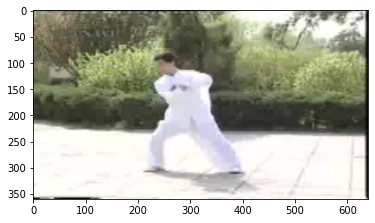

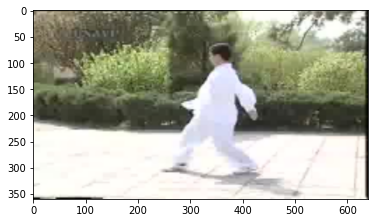

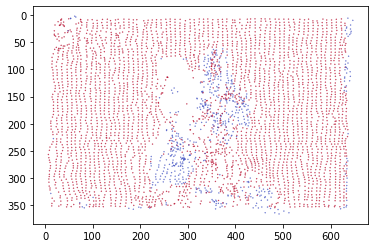

In [55]:
show_sample(dataset[123])

## Displaying dataset

### Random batch

sample id: l0aKiGrTUGw_1816


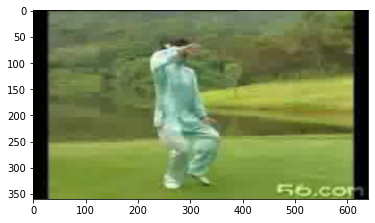

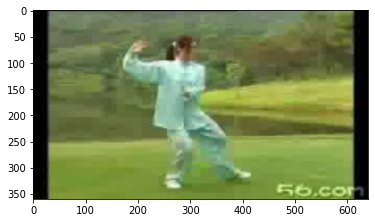

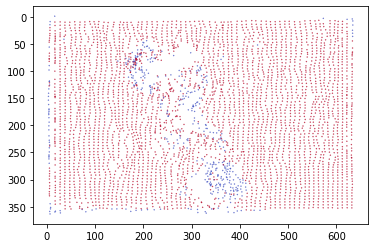

sample id: CA9-8CydW4A_4592


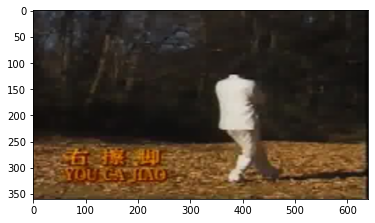

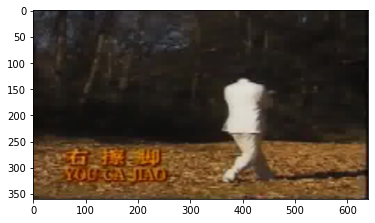

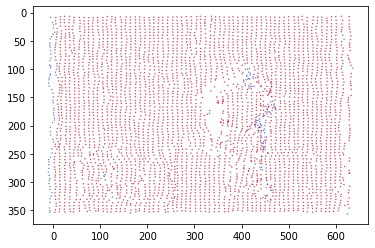

sample id: KMO1BluPtU4_1192


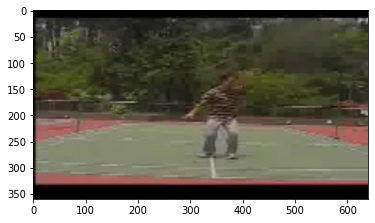

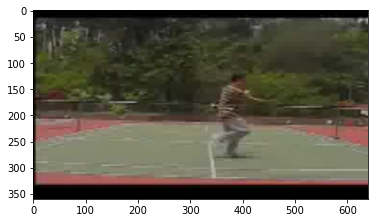

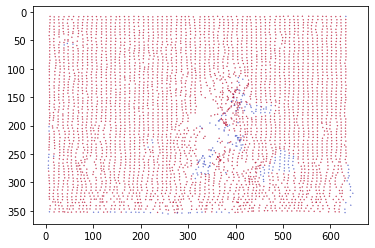

sample id: vB8XTJfV4rY_2456


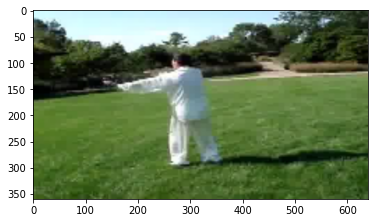

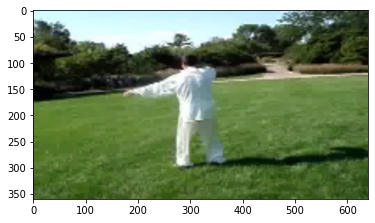

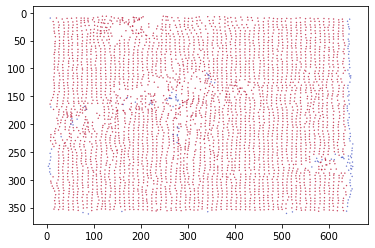

sample id: MGYF1aDwUKg_1624


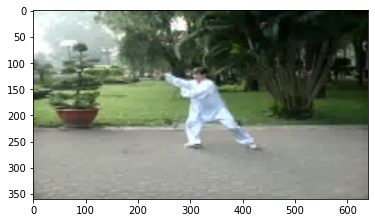

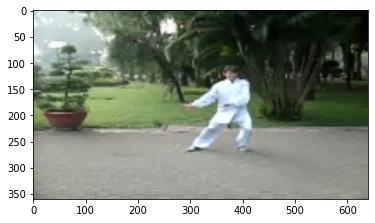

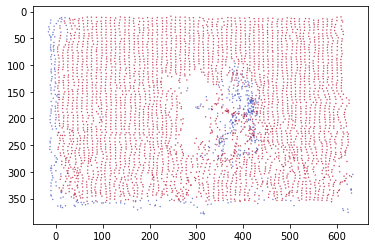

sample id: zxsGZCdT7Ns_1352


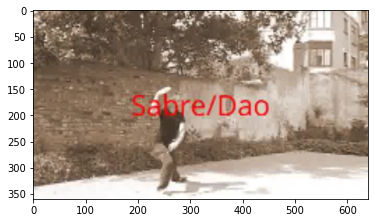

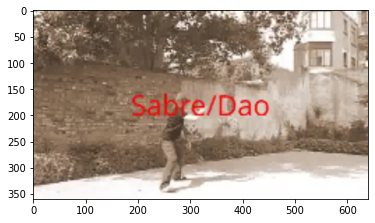

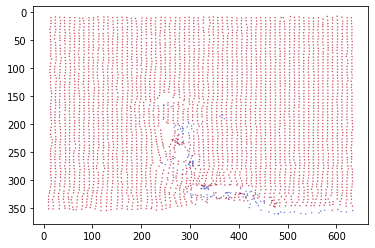

sample id: BtuIV3k5O6Q_1704


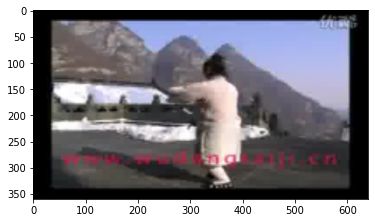

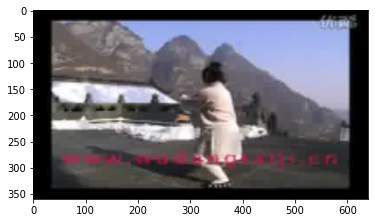

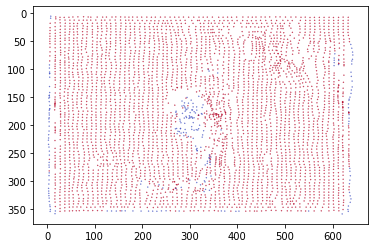

sample id: KMO1BluPtU4_1856


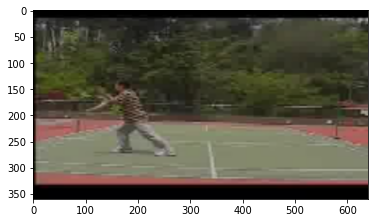

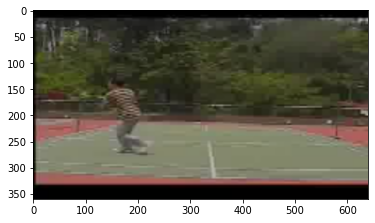

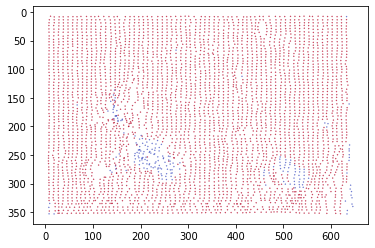

sample id: 6f6nS3PCeQM_992


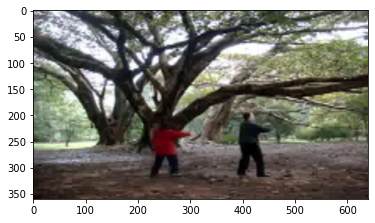

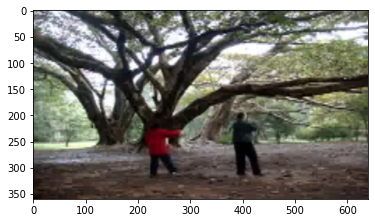

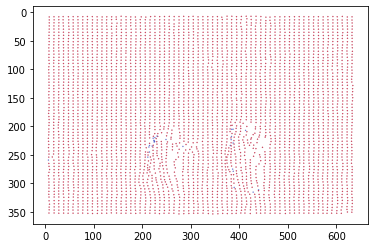

sample id: sm6-dbG5Rho_1336


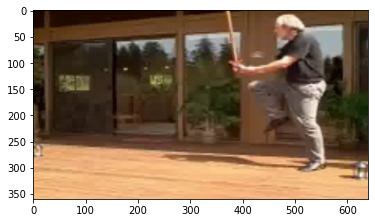

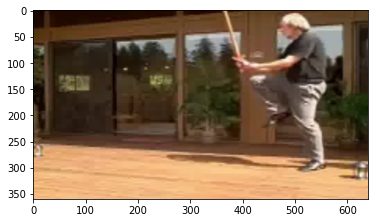

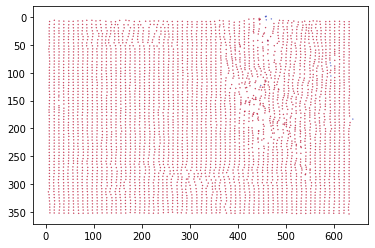

sample id: -CR4xjdQbkc_976


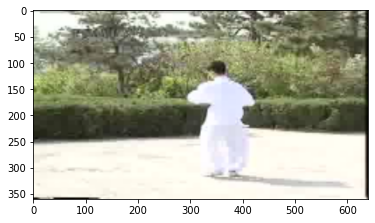

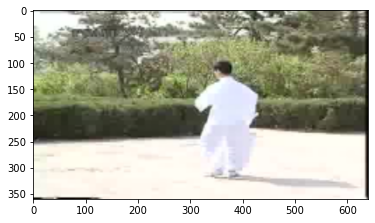

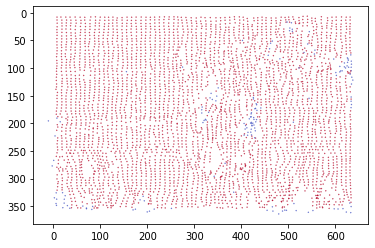

sample id: sm6-dbG5Rho_1120


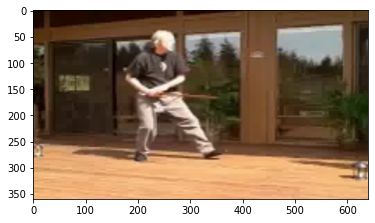

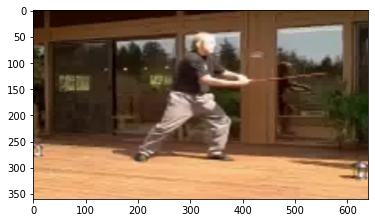

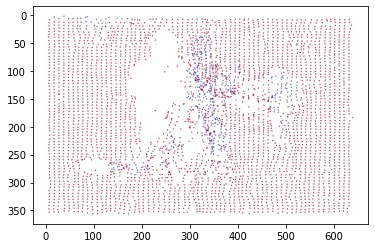

sample id: 6f6nS3PCeQM_2024


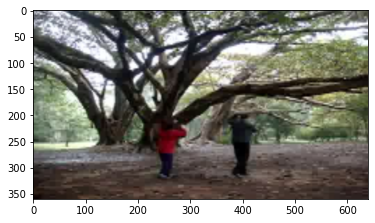

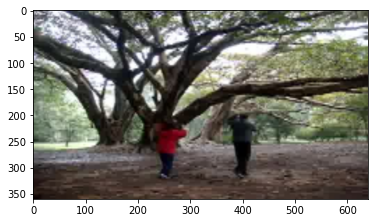

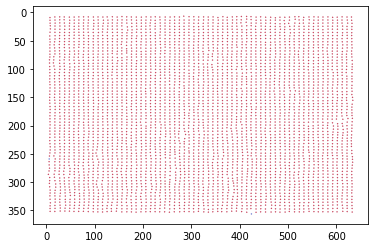

sample id: 8DemshD_8a4_2496


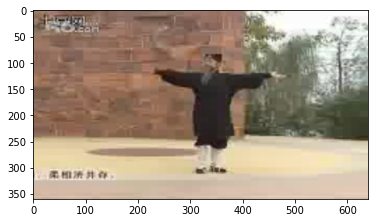

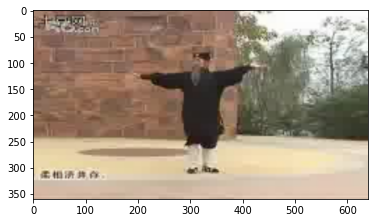

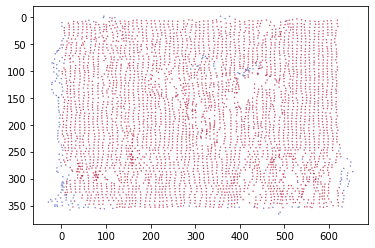

sample id: AUzpWyGi8Gw_1200


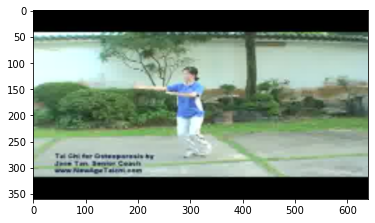

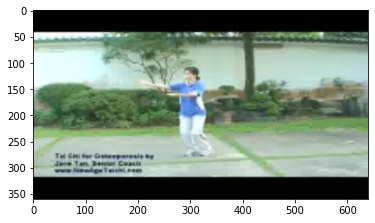

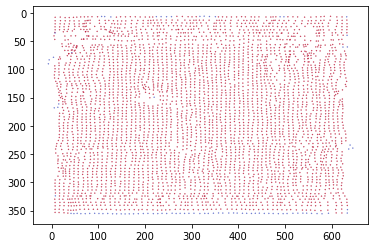

sample id: K7td6IVvS8w_3232


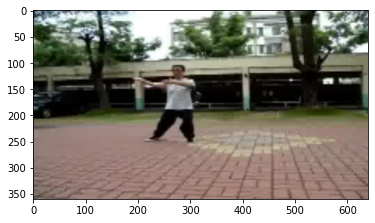

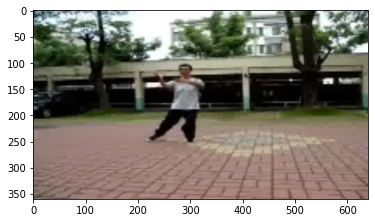

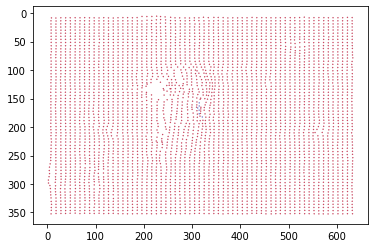

sample id: 8DemshD_8a4_2336


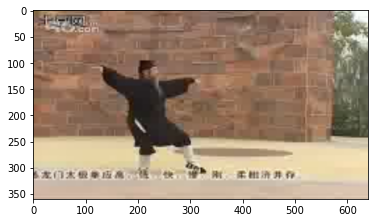

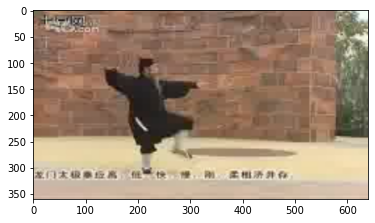

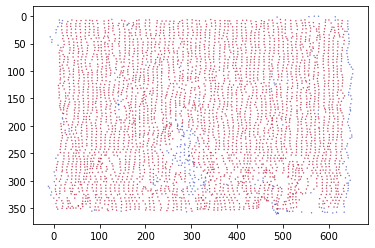

sample id: 8DemshD_8a4_3296


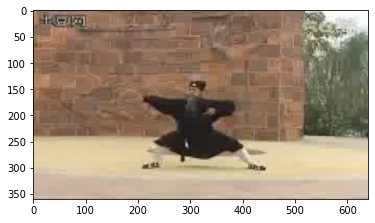

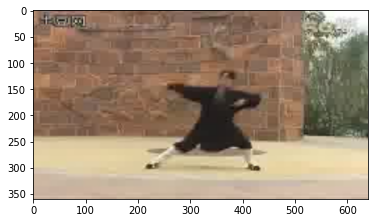

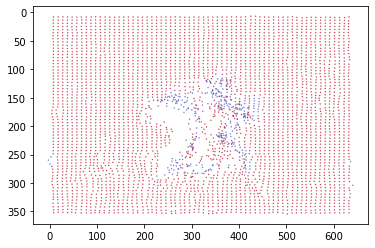

sample id: 8DemshD_8a4_3680


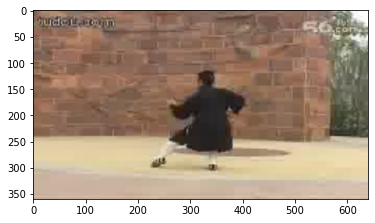

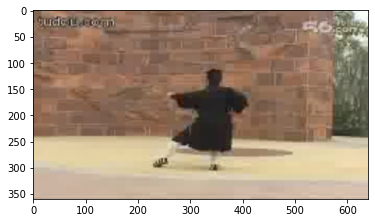

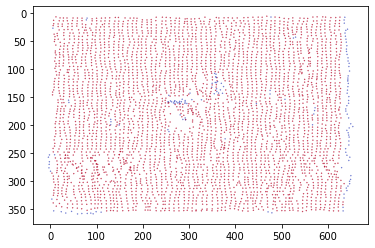

sample id: vB8XTJfV4rY_792


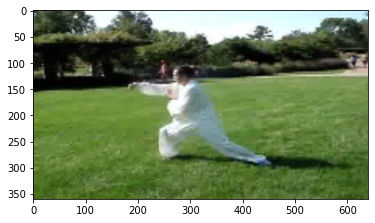

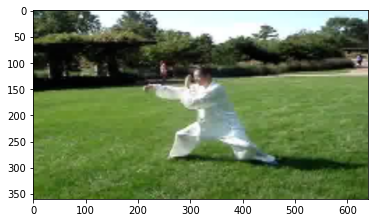

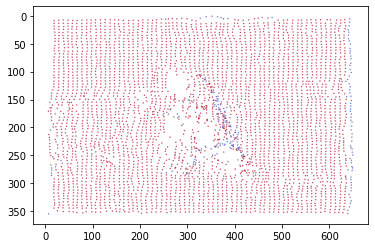

sample id: 3zIcD0hIpfc_896


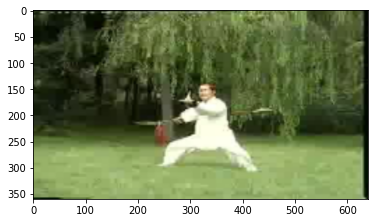

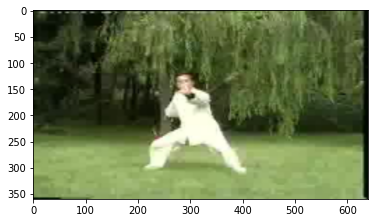

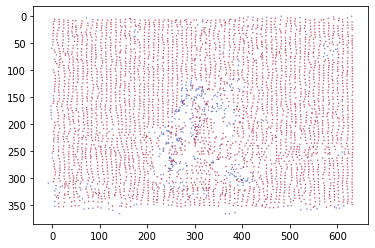

sample id: uOw-z7CR7x8_2208


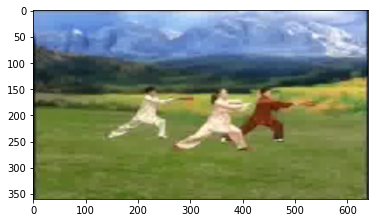

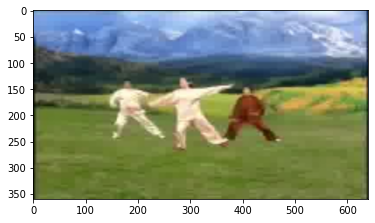

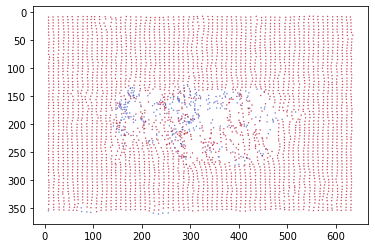

sample id: uOw-z7CR7x8_1320


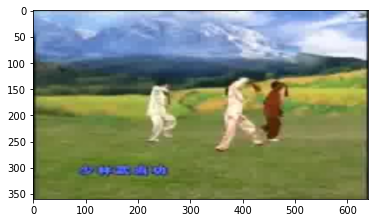

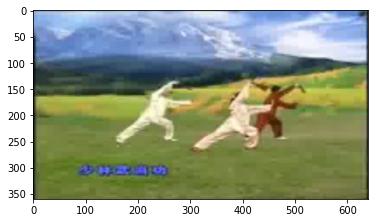

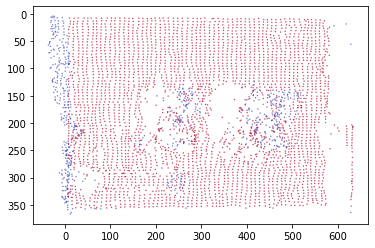

sample id: KMO1BluPtU4_2368


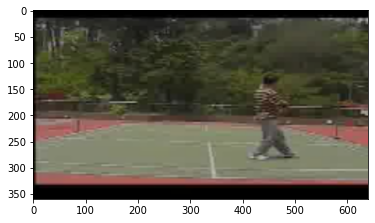

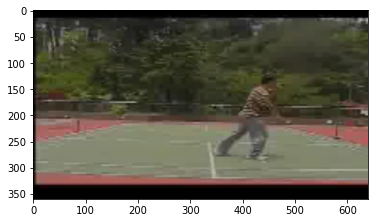

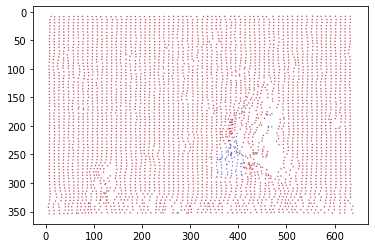

sample id: vB8XTJfV4rY_1712


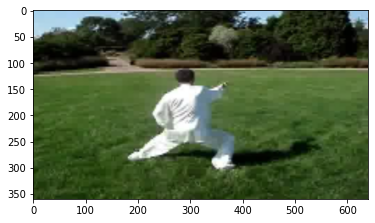

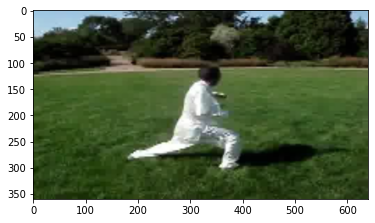

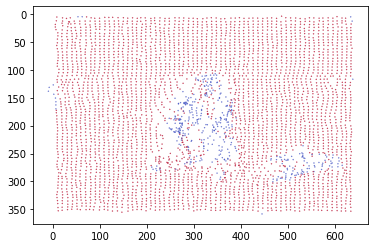

sample id: KMO1BluPtU4_976


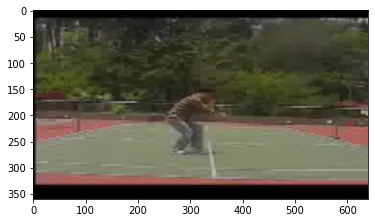

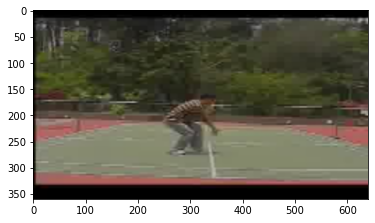

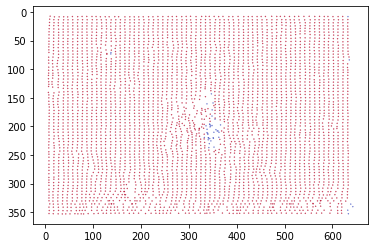

sample id: KMO1BluPtU4_1544


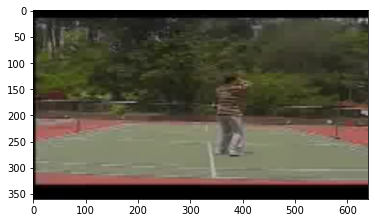

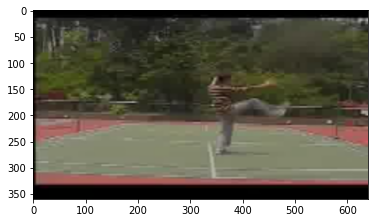

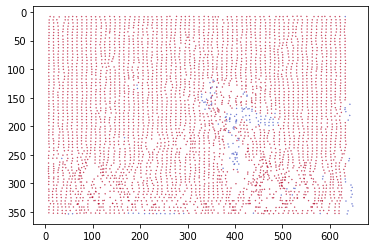

sample id: KMO1BluPtU4_936


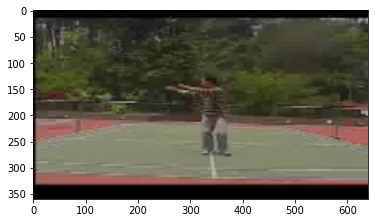

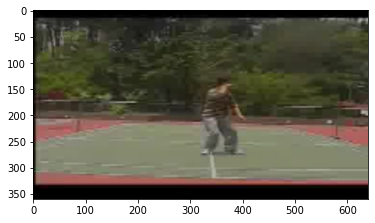

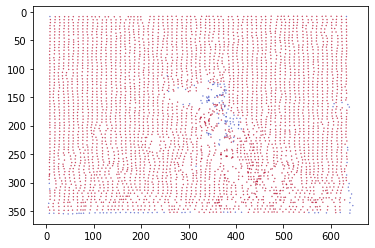

sample id: AUzpWyGi8Gw_1888


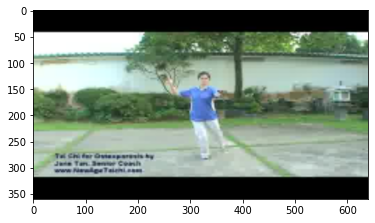

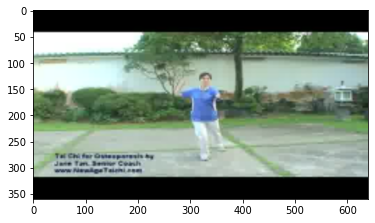

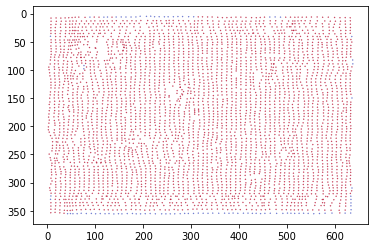

sample id: K7td6IVvS8w_1520


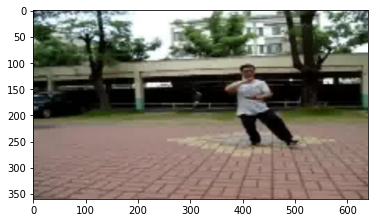

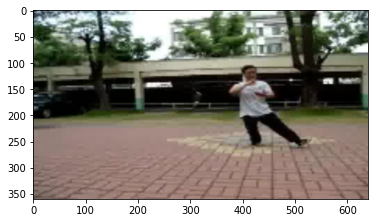

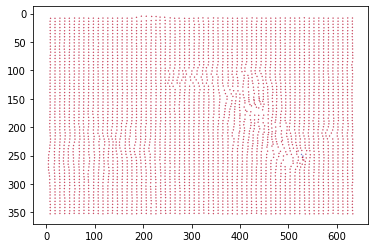

sample id: CA9-8CydW4A_3312


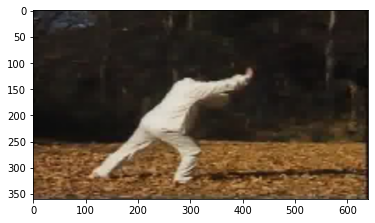

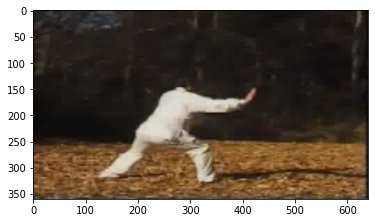

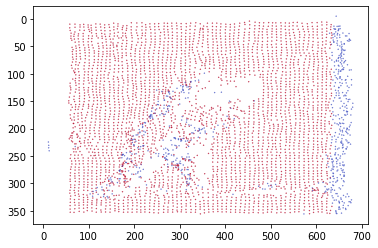

sample id: K7td6IVvS8w_3776


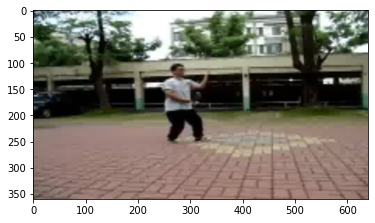

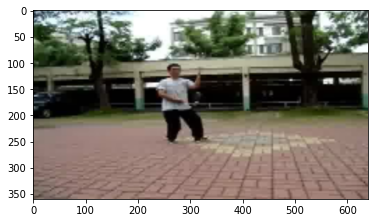

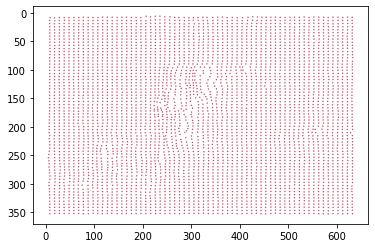

In [53]:
# Show random batch from the dataset
dataloader = DataLoader(dataset, batch_size=32, shuffle=True, num_workers=0)

for i_batch, sample_batched in enumerate(dataloader):
    # observe 4th batch and stop.
    if i_batch == 4:
      show_batch(sample_batched['id'], sample_batched['image0'], sample_batched['coords'], sample_batched['vis'], img1_batch=sample_batched['image1'])
      break